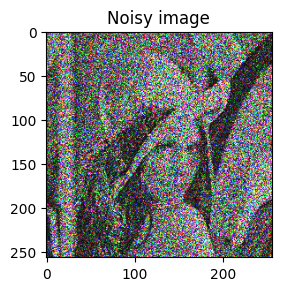

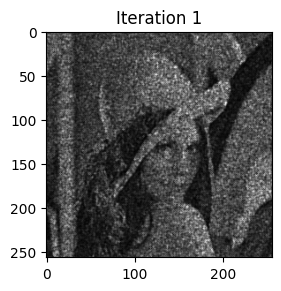

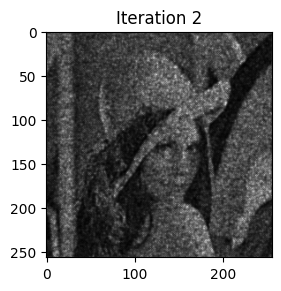

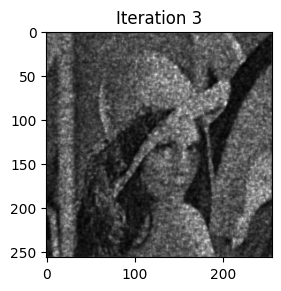

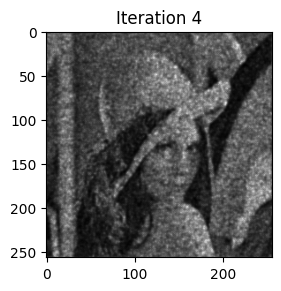

...

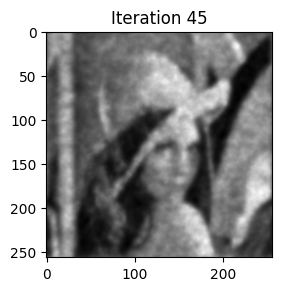

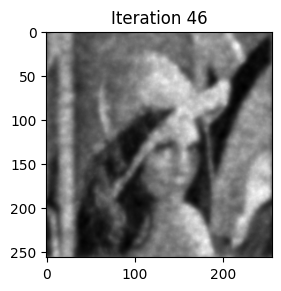

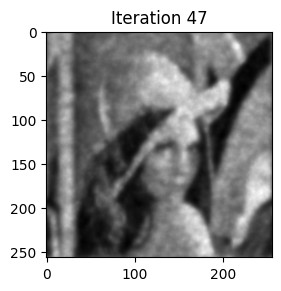

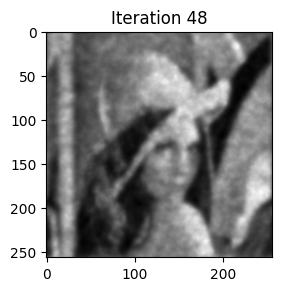

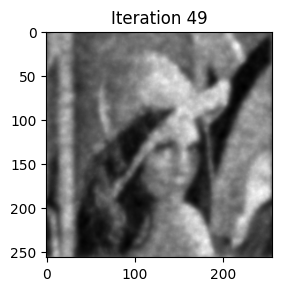

PSNR: 22.38504989742591
MSSIM: 0.7488516468333656


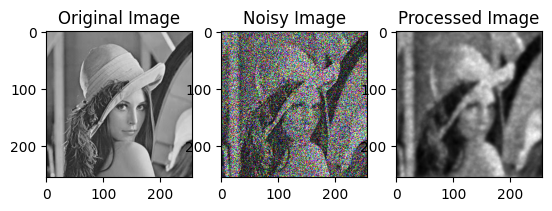

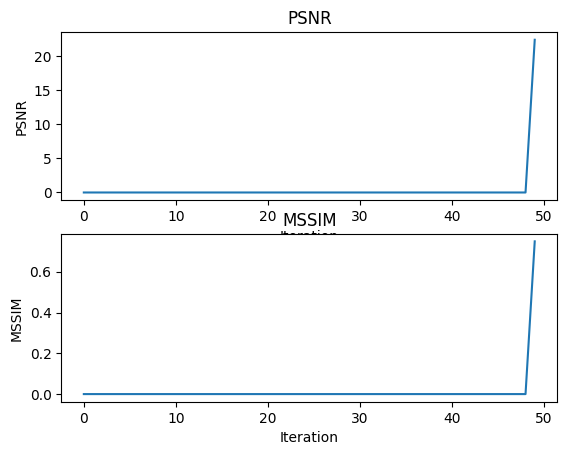

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from skimage import io, img_as_float
from skimage.metrics import peak_signal_noise_ratio as psnr, structural_similarity as ssim
from scipy.special import gamma
from scipy.ndimage import gaussian_filter
from skimage.util import random_noise
from scipy.ndimage import gaussian_gradient_magnitude, uniform_filter
from scipy.special import gamma
import torch

def perona_rhs(u_prev, nu):
    # Apply Gaussian filter
    G_sigma = gaussian_filter(u_prev, sigma=1)

    # Compute gradients
    Gx, Gy = np.gradient(G_sigma)
    grad_magnitude = np.sqrt(Gx**2 + Gy**2)

    # Compute the curvature coefficient C
    C = np.exp(-grad_magnitude**2 / nu)

    # Define translations
    def translate_image(image, di, dj):
        return np.roll(np.roll(image, di, axis=0), dj, axis=1)

    # Translate images
    Umc = translate_image(u_prev, -1, 0)  # Shifts left
    Upc = translate_image(u_prev, 1, 0)   # Shifts right
    Ucm = translate_image(u_prev, 0, -1)  # Shifts down
    Ucp = translate_image(u_prev, 0, 1)   # Shifts up

    Cmc = translate_image(C, -1, 0)  # Shifts left
    Cpc = translate_image(C, 1, 0)   # Shifts right
    Ccm = translate_image(C, 0, -1)  # Shifts down
    Ccp = translate_image(C, 0, 1)   # Shifts up

    # Update u using the discretized PDE
    result = (
        (((C + Cpc) / 2) * (Upc - u_prev) - ((Cmc + C) / 2) * (u_prev - Umc)) +
        (((C + Ccp) / 2) * (Ucp - u_prev) - ((Ccm + C) / 2) * (u_prev - Ucm))
    )

    return result

# Load image
a = io.imread('/content/drive/MyDrive/Lenna.jpg')
ref = img_as_float(a)

# Convert to grayscale
#if ref.ndim == 3:
    #ref = np.mean(ref, axis=2)  # Average the color channels to convert to grayscale

# Additive noise
#noisy = ref + np.random.normal(0, 0.05, ref.shape)
# Additive Gaussian noise
#noisy = random_noise(ref, mode='gaussian', var=0.05)

# Convert noisy image to grayscale if it's in color
#if noisy.ndim == 3:
    #noisy = np.mean(noisy, axis=2)  # Convert to grayscale by averaging RGB channels
     #noise_sigma = self.noise_sigma
L = 1
a = L
b = 1 / L
        #shape = target.shape
gamma_shape = ref.shape # the shape of the gamma noise should match the image
gamma_noise = np.random.gamma(shape=a, scale=b, size=gamma_shape).astype(np.float32)
        #shape = target.shape
        #gamma_shape = shape  # the shape of the gamma noise should match the image
        #gamma_noise = torch.from_numpy(np.random.gamma(shape=1.0, scale=noise_sigma / 255.0, size=gamma_shape)).float()

noisy = ref * gamma_noise



verbose = True
if verbose:
    plt.figure()
    plt.subplot(1, 2, 1)
    plt.imshow(noisy, cmap='gray')
    plt.title('Noisy image')
    plt.show()

# Define parameters
alpha = 0.83  # Fractional order (0 < alpha <= 1)
nu = 40
M, N, _ = ref.shape  # Unpack the shape of the grayscale image
tau = 1/7  # Time step size
Nt = 50
tolerance = 1e-6  # Stopping criterion

#u = np.zeros((M, N, Nt))  # Initialize u to store all iterations
#u[:, :, 0] = noisy  # Store initial noisy image
noisy_gray = np.mean(noisy, axis=2)  # Convert to grayscale

u = np.zeros((M, N, Nt))  # Initialize u to store all iterations
u[:, :, 0] = noisy_gray

# For omega
omega = np.zeros(Nt)
for l in range(1, Nt+1):
    omega[l-1] = (l**(1 - alpha)) - ((l-1)**(1 - alpha))

# Ensure omega(alpha, 1) > omega(alpha, 2) > ... > omega(alpha, k)
omega = np.sort(omega)[::-1]
psnr_values = np.zeros(Nt)
mssim_values = np.zeros(Nt)

# Compute omega(alpha, l) for l = 1 to k
for k in range(1, Nt):
    u_prev = u[:, :, k-1]

    # Compute the sum term
    sum_term = np.zeros((M, N))
    for l in range(k):
        if (k - l - 1) >= 0:  # Ensure index is valid
            sum_term += (omega[l] - omega[l+1]) * u[:, :, k-l-1]

    sum_final = sum_term + (omega[k] * u[:, :, 0])
    sigma = (tau**alpha) * gamma(2 - alpha)

    # Update u using the Perona-Malik type filter
    u[:, :, k] = sum_final + sigma * perona_rhs(u_prev, nu)

    # Check stopping criterion
    if np.linalg.norm(u[:, :, k] - u[:, :, k-1], 'fro') <= tolerance:
        print(f'Stopping at iteration {k} due to convergence.')
        break

    if verbose:
        plt.figure()
        plt.subplot(1, 2, 2)
        plt.imshow(u[:, :, k], cmap='gray')
        plt.title(f'Iteration {k}')
        plt.show()

    # Compute PSNR and MSSIM
mse = np.mean((ref[:,:,0] - u[:, :, k])**2) # Compare with the first channel of ref (assuming it's grayscale)
psnr_values[k] = 10 * np.log10(1 / mse)
mssim_values[k] = ssim(u[:, :, k], ref[:,:,0]) # Also compare with the first channel for SSIM

# Display the final result and PSNR
print(f'PSNR: {psnr_values[k]}')
print(f'MSSIM: {mssim_values[k]}')

# Display results
plt.figure()
plt.subplot(1, 3, 1)
plt.imshow(ref, cmap='gray')
plt.title('Original Image')

plt.subplot(1, 3, 2)
plt.imshow(noisy, cmap='gray')
plt.title('Noisy Image')

plt.subplot(1, 3, 3)
plt.imshow(u[:, :, k], cmap='gray')
plt.title('Processed Image')
plt.show()

# Plot PSNR and MSSIM over iterations
plt.figure()
plt.subplot(2, 1, 1)
plt.plot(range(Nt), psnr_values)
plt.xlabel('Iteration')
plt.ylabel('PSNR')
plt.title('PSNR')

plt.subplot(2, 1, 2)
plt.plot(range(Nt), mssim_values)
plt.xlabel('Iteration')
plt.ylabel('MSSIM')
plt.title('MSSIM')
plt.show()


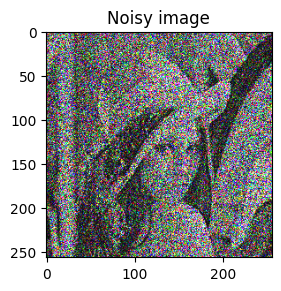

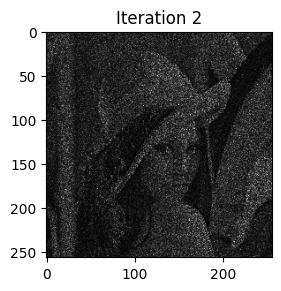

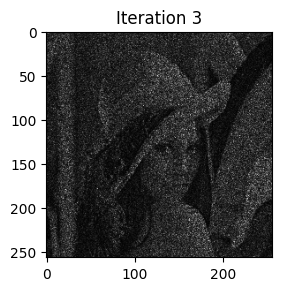

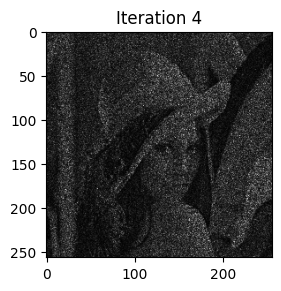

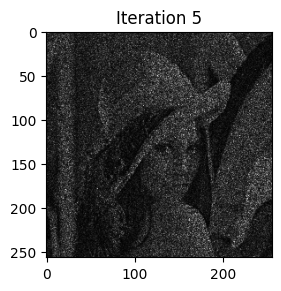

...

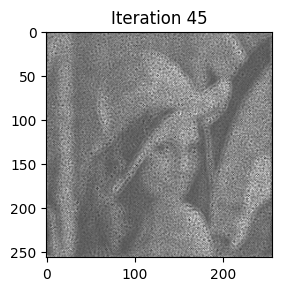

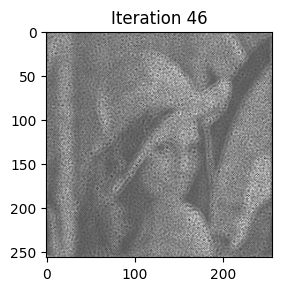

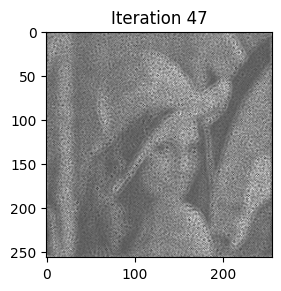

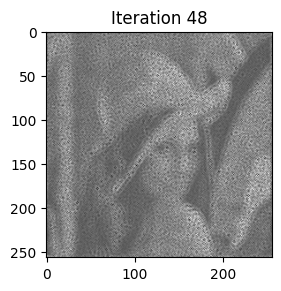

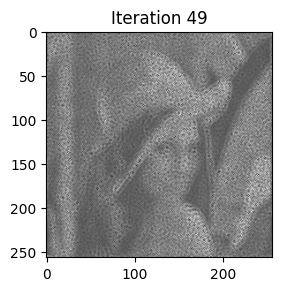

PSNR: 13.134547681910787
MSSIM: 0.12289868057021842


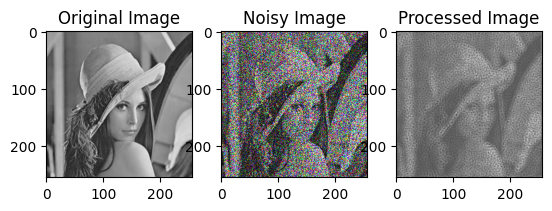

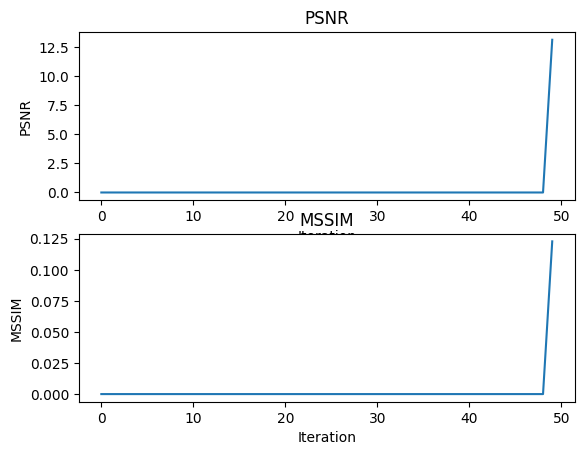

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from skimage import io, img_as_float
from skimage.metrics import peak_signal_noise_ratio as psnr, structural_similarity as ssim
from scipy.special import gamma
from scipy.ndimage import gaussian_filter
from skimage.util import random_noise
from scipy.ndimage import gaussian_gradient_magnitude, uniform_filter
from scipy.special import gamma
import torch

def perona_rhs(u_prev, nu):
    # Apply Gaussian filter
    G_sigma = gaussian_filter(u_prev, sigma=1)

    # Compute gradients
    Gx, Gy = np.gradient(G_sigma)
    grad_magnitude = np.sqrt(Gx**2 + Gy**2)

    # Compute the curvature coefficient C
    C = np.exp(-grad_magnitude**2 / nu)

    # Define translations
    def translate_image(image, di, dj):
        return np.roll(np.roll(image, di, axis=0), dj, axis=1)

    # Translate images
    Umc = translate_image(u_prev, -1, 0)  # Shifts left
    Upc = translate_image(u_prev, 1, 0)   # Shifts right
    Ucm = translate_image(u_prev, 0, -1)  # Shifts down
    Ucp = translate_image(u_prev, 0, 1)   # Shifts up

    Cmc = translate_image(C, -1, 0)  # Shifts left
    Cpc = translate_image(C, 1, 0)   # Shifts right
    Ccm = translate_image(C, 0, -1)  # Shifts down
    Ccp = translate_image(C, 0, 1)   # Shifts up

    # Update u using the discretized PDE
    result = (
        (((C + Cpc) / 2) * (Upc - u_prev) - ((Cmc + C) / 2) * (u_prev - Umc)) +
        (((C + Ccp) / 2) * (Ucp - u_prev) - ((Ccm + C) / 2) * (u_prev - Ucm))
    )

    return result

# Load image
a = io.imread('/content/drive/MyDrive/Lenna.jpg')
ref = img_as_float(a)

# Convert to grayscale
#if ref.ndim == 3:
    #ref = np.mean(ref, axis=2)  # Average the color channels to convert to grayscale

# Additive noise
#noisy = ref + np.random.normal(0, 0.05, ref.shape)
# Additive Gaussian noise
#noisy = random_noise(ref, mode='gaussian', var=0.05)

# Convert noisy image to grayscale if it's in color
#if noisy.ndim == 3:
    #noisy = np.mean(noisy, axis=2)  # Convert to grayscale by averaging RGB channels
     #noise_sigma = self.noise_sigma
L = 1
a = L
b = 1 / L
        #shape = target.shape
gamma_shape = ref.shape # the shape of the gamma noise should match the image
gamma_noise = np.random.gamma(shape=a, scale=b, size=gamma_shape).astype(np.float32)
        #shape = target.shape
        #gamma_shape = shape  # the shape of the gamma noise should match the image
        #gamma_noise = torch.from_numpy(np.random.gamma(shape=1.0, scale=noise_sigma / 255.0, size=gamma_shape)).float()

noisy = ref * gamma_noise



verbose = True
if verbose:
    plt.figure()
    plt.subplot(1, 2, 1)
    plt.imshow(noisy, cmap='gray')
    plt.title('Noisy image')
    plt.show()

# Define parameters
alpha = 0.83  # Fractional order (0 < alpha <= 1)
nu = 40
M, N, _ = ref.shape  # Unpack the shape of the grayscale image
tau = 1/7  # Time step size
Nt = 50
tolerance = 1e-6  # Stopping criterion
gamma2=10
tow=0.05
#u = np.zeros((M, N, Nt))  # Initialize u to store all iterations
#u[:, :, 0] = noisy  # Store initial noisy image

#u = np.zeros((M, N, Nt))  # Initialize u to store all iterations
#u[:, :, 0] = noisy  # Store initial noisy image
noisy_gray = np.mean(noisy, axis=2)  # Convert to grayscale

u = np.zeros((M, N, Nt))  # Initialize u to store all iterations
u[:, :, 0] = noisy_gray
u[:, :, 1]=noisy_gray

# For omega
omega = np.zeros(Nt)
for l in range(1, Nt+1):
    omega[l-1] = (l**(1 - alpha)) - ((l-1)**(1 - alpha))

# Ensure omega(alpha, 1) > omega(alpha, 2) > ... > omega(alpha, k)
omega = np.sort(omega)[::-1]
psnr_values = np.zeros(Nt)
mssim_values = np.zeros(Nt)

# Compute omega(alpha, l) for l = 1 to k
for k in range(2, Nt):
    u_prev = u[:, :, k-1]

    # Compute the sum term
    sum_term = np.zeros((M, N))
    for l in range(k):
        if (k - l - 1) >= 0:  # Ensure index is valid
            sum_term += (omega[l] - omega[l+1]) * u[:, :, k-l-1]

    sum_final = sum_term + (omega[k] * u[:, :, 0])
    sigma = (tau**alpha) * gamma(2 - alpha)
    #for i in range(1,3):
      #u[:, :, k-1]=noisy
    #u[:, :, k-1]=u[:, :, k]


    # Update u using the Perona-Malik type filter
    #u[:, :, k] = u[:, :, k-1] - u[:, :, k-2]+ sum_final + sigma * perona_rhs(u_prev, nu)
    u[:, :, k] = u[:, :, k-1] *(2-(gamma2*((tow)**2) * sigma)) - u[:, :, k-2]+ (gamma2*((tow)**2) * sigma) * sum_final + ((tow)**2 )* perona_rhs(u_prev, nu)

    # Check stopping criterion
    if np.linalg.norm(u[:, :, k] - u[:, :, k-1], 'fro') <= tolerance:
        print(f'Stopping at iteration {k} due to convergence.')
        break

    if verbose:
        plt.figure()
        plt.subplot(1, 2, 2)
        plt.imshow(u[:, :, k], cmap='gray')
        plt.title(f'Iteration {k}')
        plt.show()

    # Compute PSNR and MSSIM
mse = np.mean((ref[:,:,0] - u[:, :, k])**2) # Compare with the first channel of ref (assuming it's grayscale)
psnr_values[k] = 10 * np.log10(1 / mse)
mssim_values[k] = ssim(u[:, :, k], ref[:,:,0]) # Also compare with the first channel for SSIM

# Display the final result and PSNR
print(f'PSNR: {psnr_values[k]}')
print(f'MSSIM: {mssim_values[k]}')

# Display results
plt.figure()
plt.subplot(1, 3, 1)
plt.imshow(ref, cmap='gray')
plt.title('Original Image')

plt.subplot(1, 3, 2)
plt.imshow(noisy, cmap='gray')
plt.title('Noisy Image')

plt.subplot(1, 3, 3)
plt.imshow(u[:, :, k], cmap='gray')
plt.title('Processed Image')
plt.show()

# Plot PSNR and MSSIM over iterations
plt.figure()
plt.subplot(2, 1, 1)
plt.plot(range(Nt), psnr_values)
plt.xlabel('Iteration')
plt.ylabel('PSNR')
plt.title('PSNR')

plt.subplot(2, 1, 2)
plt.plot(range(Nt), mssim_values)
plt.xlabel('Iteration')
plt.ylabel('MSSIM')
plt.title('MSSIM')
plt.show()


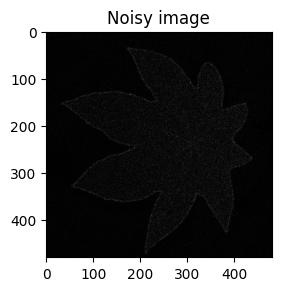

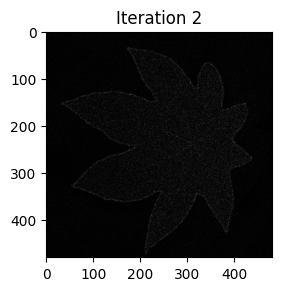

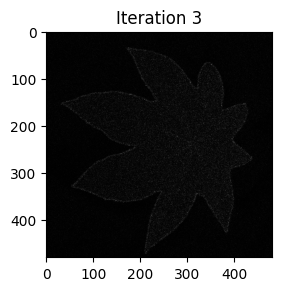

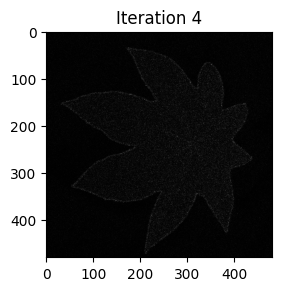

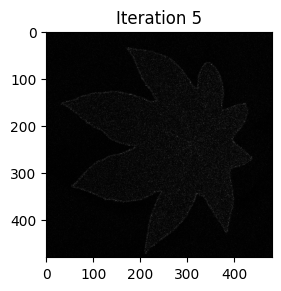

...

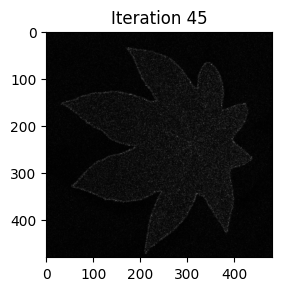

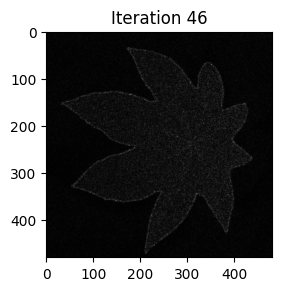

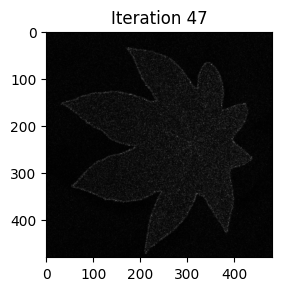

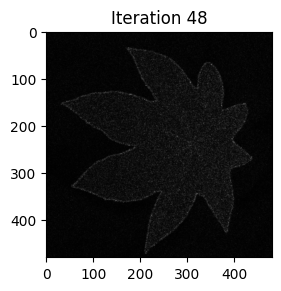

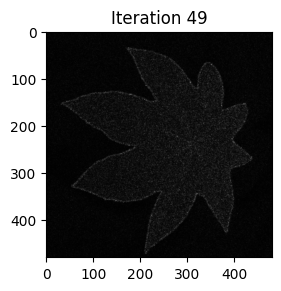

PSNR: 13.857139689722544
MSSIM: 0.30847934444877495


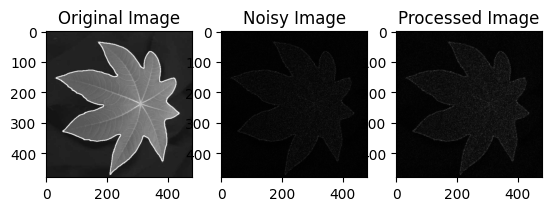

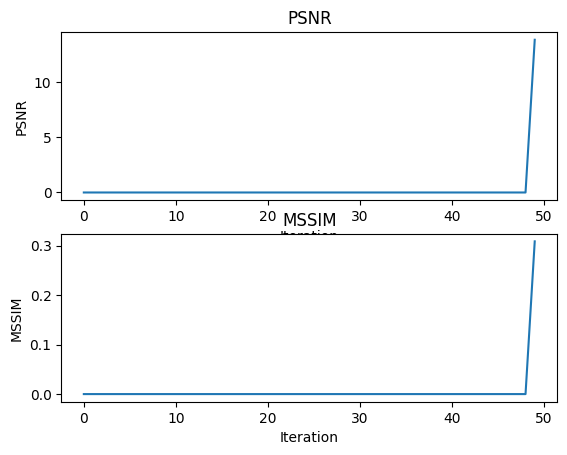

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from skimage import io, img_as_float
from skimage.metrics import peak_signal_noise_ratio as psnr, structural_similarity as ssim
from scipy.special import gamma
from scipy.ndimage import gaussian_filter
from skimage.util import random_noise
from scipy.ndimage import gaussian_gradient_magnitude, uniform_filter
from scipy.special import gamma
import torch

def perona_rhs(u_prev, nu):
    # Apply Gaussian filter
    G_sigma = gaussian_filter(u_prev, sigma=1)

    # Compute gradients
    Gx, Gy = np.gradient(G_sigma)
    grad_magnitude = np.sqrt(Gx**2 + Gy**2)

    # Compute the curvature coefficient C
    C = np.exp(-grad_magnitude**2 / nu)

    # Define translations
    def translate_image(image, di, dj):
        return np.roll(np.roll(image, di, axis=0), dj, axis=1)

    # Translate images
    Umc = translate_image(u_prev, -1, 0)  # Shifts left
    Upc = translate_image(u_prev, 1, 0)   # Shifts right
    Ucm = translate_image(u_prev, 0, -1)  # Shifts down
    Ucp = translate_image(u_prev, 0, 1)   # Shifts up

    Cmc = translate_image(C, -1, 0)  # Shifts left
    Cpc = translate_image(C, 1, 0)   # Shifts right
    Ccm = translate_image(C, 0, -1)  # Shifts down
    Ccp = translate_image(C, 0, 1)   # Shifts up

    # Update u using the discretized PDE
    result = (
        (((C + Cpc) / 2) * (Upc - u_prev) - ((Cmc + C) / 2) * (u_prev - Umc)) +
        (((C + Ccp) / 2) * (Ucp - u_prev) - ((Ccm + C) / 2) * (u_prev - Ucm))
    )

    return result

# Load image
a = io.imread('/content/drive/MyDrive/leaf.jpg')
ref = img_as_float(a)

# Convert to grayscale
#if ref.ndim == 3:
    #ref = np.mean(ref, axis=2)  # Average the color channels to convert to grayscale

# Additive noise
#noisy = ref + np.random.normal(0, 0.05, ref.shape)
# Additive Gaussian noise
#noisy = random_noise(ref, mode='gaussian', var=0.05)

# Convert noisy image to grayscale if it's in color
#if noisy.ndim == 3:
    #noisy = np.mean(noisy, axis=2)  # Convert to grayscale by averaging RGB channels
     #noise_sigma = self.noise_sigma
L = 1
a = L
b = 1 / L
        #shape = target.shape
gamma_shape = ref.shape # the shape of the gamma noise should match the image
gamma_noise = np.random.gamma(shape=a, scale=b, size=gamma_shape).astype(np.float32)
        #shape = target.shape
        #gamma_shape = shape  # the shape of the gamma noise should match the image
        #gamma_noise = torch.from_numpy(np.random.gamma(shape=1.0, scale=noise_sigma / 255.0, size=gamma_shape)).float()

noisy = ref * gamma_noise



verbose = True
if verbose:
    plt.figure()
    plt.subplot(1, 2, 1)
    plt.imshow(noisy, cmap='gray')
    plt.title('Noisy image')
    plt.show()

# Define parameters
alpha = 0.83  # Fractional order (0 < alpha <= 1)
nu = 40
#M, N,_= ref.shape  # Unpack the shape of the grayscale image
M, N = ref.shape  # Unpack the shape of the grayscale image
tau = 1/7  # Time step size
Nt = 50
tolerance = 1e-6  # Stopping criterion
gamma2=10
tow=0.01
#u = np.zeros((M, N, Nt))  # Initialize u to store all iterations
#u[:, :, 0] = noisy  # Store initial noisy image

#u = np.zeros((M, N, Nt))  # Initialize u to store all iterations
#u[:, :, 0] = noisy  # Store initial noisy image
#noisy_gray = np.mean(noisy, axis=2)  # Convert to grayscale

u = np.zeros((M, N, Nt))  # Initialize u to store all iterations
u[:, :, 0] = noisy  # Store the noisy image directly as it is already grayscale
u[:, :, 1] = noisy

# For omega
omega = np.zeros(Nt)
for l in range(1, Nt+1):
    omega[l-1] = (l**(1 - alpha)) - ((l-1)**(1 - alpha))

# Ensure omega(alpha, 1) > omega(alpha, 2) > ... > omega(alpha, k)
omega = np.sort(omega)[::-1]
psnr_values = np.zeros(Nt)
mssim_values = np.zeros(Nt)

# Compute omega(alpha, l) for l = 1 to k
for k in range(2, Nt):
    u_prev = u[:, :, k-1]

    # Compute the sum term
    sum_term = np.zeros((M, N))
    for l in range(k):
        if (k - l - 1) >= 0:  # Ensure index is valid
            sum_term += (omega[l] - omega[l+1]) * u[:, :, k-l-1]

    sum_final = sum_term + (omega[k] * u[:, :, 0])
    sigma = (tau**alpha) * gamma(2 - alpha)
    #for i in range(1,3):
      #u[:, :, k-1]=noisy
    #u[:, :, k-1]=u[:, :, k]


    # Update u using the Perona-Malik type filter
    #u[:, :, k] = u[:, :, k-1] - u[:, :, k-2]+ sum_final + sigma * perona_rhs(u_prev, nu)
    u[:, :, k] = u[:, :, k-1] *(2-(gamma2*((tow)**2) * sigma)) - u[:, :, k-2]+ (gamma2*((tow)**2) * sigma) * sum_final + ((tow)**2 )* perona_rhs(u_prev, nu)

    # Check stopping criterion
    if np.linalg.norm(u[:, :, k] - u[:, :, k-1], 'fro') <= tolerance:
        print(f'Stopping at iteration {k} due to convergence.')
        break

    if verbose:
        plt.figure()
        plt.subplot(1, 2, 2)
        plt.imshow(u[:, :, k], cmap='gray')
        plt.title(f'Iteration {k}')
        plt.show()

    # Compute PSNR and MSSIM
# Compute PSNR and MSSIM
mse = np.mean((ref - u[:, :, k])**2) # ref is already grayscale
psnr_values[k] = 10 * np.log10(1 / mse)
mssim_values[k] = ssim(u[:, :, k], ref) # ref is already grayscale

# Display the final result and PSNR
print(f'PSNR: {psnr_values[k]}')
print(f'MSSIM: {mssim_values[k]}')

# Display results
plt.figure()
plt.subplot(1, 3, 1)
plt.imshow(ref, cmap='gray')
plt.title('Original Image')

plt.subplot(1, 3, 2)
plt.imshow(noisy, cmap='gray')
plt.title('Noisy Image')

plt.subplot(1, 3, 3)
plt.imshow(u[:, :, k], cmap='gray')
plt.title('Processed Image')
plt.show()

# Plot PSNR and MSSIM over iterations
plt.figure()
plt.subplot(2, 1, 1)
plt.plot(range(Nt), psnr_values)
plt.xlabel('Iteration')
plt.ylabel('PSNR')
plt.title('PSNR')

plt.subplot(2, 1, 2)
plt.plot(range(Nt), mssim_values)
plt.xlabel('Iteration')
plt.ylabel('MSSIM')
plt.title('MSSIM')
plt.show()


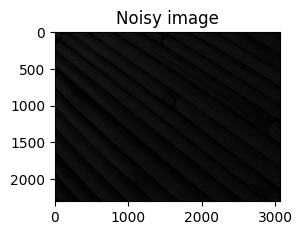

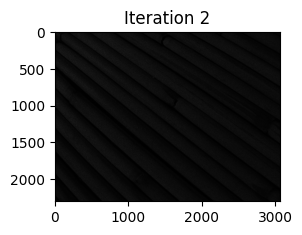

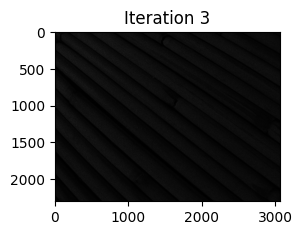

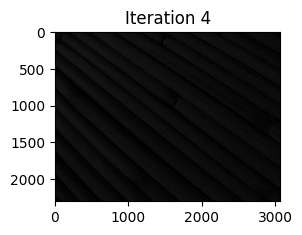

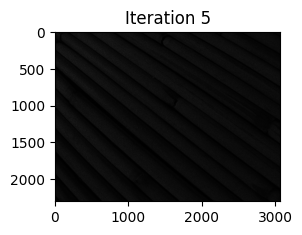

...

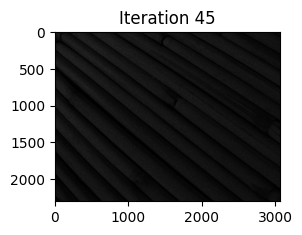

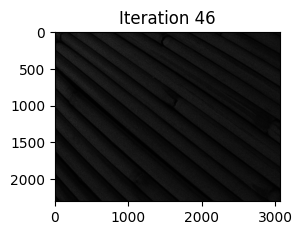

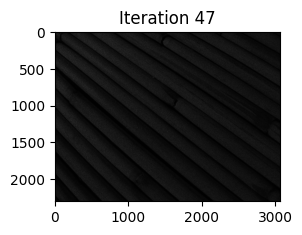

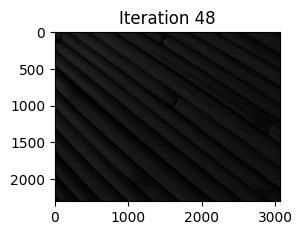

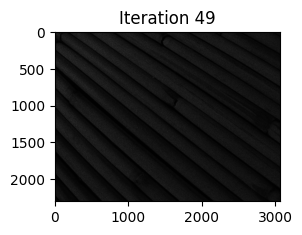

PSNR: 9.30924789584165
MSSIM: 0.1312079401465982


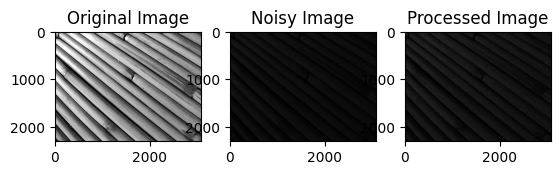

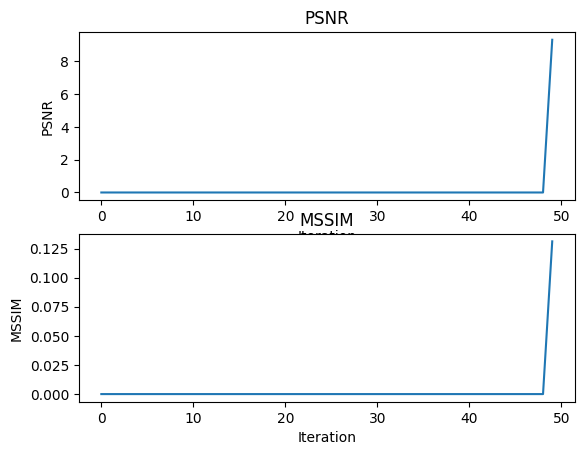

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from skimage import io, img_as_float
from skimage.metrics import peak_signal_noise_ratio as psnr, structural_similarity as ssim
from scipy.special import gamma
from scipy.ndimage import gaussian_filter
from skimage.util import random_noise
from scipy.ndimage import gaussian_gradient_magnitude, uniform_filter
from scipy.special import gamma
import torch

def perona_rhs(u_prev, nu):
    # Apply Gaussian filter
    G_sigma = gaussian_filter(u_prev, sigma=1)

    # Compute gradients
    Gx, Gy = np.gradient(G_sigma)
    grad_magnitude = np.sqrt(Gx**2 + Gy**2)

    # Compute the curvature coefficient C
    C = np.exp(-grad_magnitude**2 / nu)

    # Define translations
    def translate_image(image, di, dj):
        return np.roll(np.roll(image, di, axis=0), dj, axis=1)

    # Translate images
    Umc = translate_image(u_prev, -1, 0)  # Shifts left
    Upc = translate_image(u_prev, 1, 0)   # Shifts right
    Ucm = translate_image(u_prev, 0, -1)  # Shifts down
    Ucp = translate_image(u_prev, 0, 1)   # Shifts up

    Cmc = translate_image(C, -1, 0)  # Shifts left
    Cpc = translate_image(C, 1, 0)   # Shifts right
    Ccm = translate_image(C, 0, -1)  # Shifts down
    Ccp = translate_image(C, 0, 1)   # Shifts up

    # Update u using the discretized PDE
    result = (
        (((C + Cpc) / 2) * (Upc - u_prev) - ((Cmc + C) / 2) * (u_prev - Umc)) +
        (((C + Ccp) / 2) * (Ucp - u_prev) - ((Ccm + C) / 2) * (u_prev - Ucm))
    )

    return result

# Load image
a = io.imread('/content/drive/MyDrive/bamboo-texture-1-1171455.jpeg')
ref = img_as_float(a)

# Convert to grayscale
#if ref.ndim == 3:
    #ref = np.mean(ref, axis=2)  # Average the color channels to convert to grayscale

# Additive noise
#noisy = ref + np.random.normal(0, 0.05, ref.shape)
# Additive Gaussian noise
#noisy = random_noise(ref, mode='gaussian', var=0.05)

# Convert noisy image to grayscale if it's in color
#if noisy.ndim == 3:
    #noisy = np.mean(noisy, axis=2)  # Convert to grayscale by averaging RGB channels
     #noise_sigma = self.noise_sigma
L = 1
a = L
b = 1 / L
        #shape = target.shape
gamma_shape = ref.shape # the shape of the gamma noise should match the image
gamma_noise = np.random.gamma(shape=a, scale=b, size=gamma_shape).astype(np.float32)
        #shape = target.shape
        #gamma_shape = shape  # the shape of the gamma noise should match the image
        #gamma_noise = torch.from_numpy(np.random.gamma(shape=1.0, scale=noise_sigma / 255.0, size=gamma_shape)).float()

noisy = ref * gamma_noise



verbose = True
if verbose:
    plt.figure()
    plt.subplot(1, 2, 1)
    plt.imshow(noisy, cmap='gray')
    plt.title('Noisy image')
    plt.show()

# Define parameters
alpha = 0.83  # Fractional order (0 < alpha <= 1)
nu = 40
#M, N,_= ref.shape  # Unpack the shape of the grayscale image
M, N = ref.shape  # Unpack the shape of the grayscale image
tau = 1/7  # Time step size
Nt = 50
tolerance = 1e-6  # Stopping criterion
gamma2=10
tow=0.01
#u = np.zeros((M, N, Nt))  # Initialize u to store all iterations
#u[:, :, 0] = noisy  # Store initial noisy image

#u = np.zeros((M, N, Nt))  # Initialize u to store all iterations
#u[:, :, 0] = noisy  # Store initial noisy image
#noisy_gray = np.mean(noisy, axis=2)  # Convert to grayscale

u = np.zeros((M, N, Nt))  # Initialize u to store all iterations
u[:, :, 0] = noisy  # Store the noisy image directly as it is already grayscale
u[:, :, 1] = noisy

# For omega
omega = np.zeros(Nt)
for l in range(1, Nt+1):
    omega[l-1] = (l**(1 - alpha)) - ((l-1)**(1 - alpha))

# Ensure omega(alpha, 1) > omega(alpha, 2) > ... > omega(alpha, k)
omega = np.sort(omega)[::-1]
psnr_values = np.zeros(Nt)
mssim_values = np.zeros(Nt)

# Compute omega(alpha, l) for l = 1 to k
for k in range(2, Nt):
    u_prev = u[:, :, k-1]

    # Compute the sum term
    sum_term = np.zeros((M, N))
    for l in range(k):
        if (k - l - 1) >= 0:  # Ensure index is valid
            sum_term += (omega[l] - omega[l+1]) * u[:, :, k-l-1]

    sum_final = sum_term + (omega[k] * u[:, :, 0])
    sigma = (tau**alpha) * gamma(2 - alpha)
    #for i in range(1,3):
      #u[:, :, k-1]=noisy
    #u[:, :, k-1]=u[:, :, k]


    # Update u using the Perona-Malik type filter
    #u[:, :, k] = u[:, :, k-1] - u[:, :, k-2]+ sum_final + sigma * perona_rhs(u_prev, nu)
    u[:, :, k] = u[:, :, k-1] *(2-(gamma2*((tow)**2) * sigma)) - u[:, :, k-2]+ (gamma2*((tow)**2) * sigma) * sum_final + ((tow)**2 )* perona_rhs(u_prev, nu)

    # Check stopping criterion
    if np.linalg.norm(u[:, :, k] - u[:, :, k-1], 'fro') <= tolerance:
        print(f'Stopping at iteration {k} due to convergence.')
        break

    if verbose:
        plt.figure()
        plt.subplot(1, 2, 2)
        plt.imshow(u[:, :, k], cmap='gray')
        plt.title(f'Iteration {k}')
        plt.show()

    # Compute PSNR and MSSIM
# Compute PSNR and MSSIM
mse = np.mean((ref - u[:, :, k])**2) # ref is already grayscale
psnr_values[k] = 10 * np.log10(1 / mse)
mssim_values[k] = ssim(u[:, :, k], ref) # ref is already grayscale

# Display the final result and PSNR
print(f'PSNR: {psnr_values[k]}')
print(f'MSSIM: {mssim_values[k]}')

# Display results
plt.figure()
plt.subplot(1, 3, 1)
plt.imshow(ref, cmap='gray')
plt.title('Original Image')

plt.subplot(1, 3, 2)
plt.imshow(noisy, cmap='gray')
plt.title('Noisy Image')

plt.subplot(1, 3, 3)
plt.imshow(u[:, :, k], cmap='gray')
plt.title('Processed Image')
plt.show()

# Plot PSNR and MSSIM over iterations
plt.figure()
plt.subplot(2, 1, 1)
plt.plot(range(Nt), psnr_values)
plt.xlabel('Iteration')
plt.ylabel('PSNR')
plt.title('PSNR')

plt.subplot(2, 1, 2)
plt.plot(range(Nt), mssim_values)
plt.xlabel('Iteration')
plt.ylabel('MSSIM')
plt.title('MSSIM')
plt.show()
